In [2]:
! pip install geopandas

   ---------------------------------------- 0.0/323.6 kB ? eta -:--:--
   ---- ---------------------------------- 41.0/323.6 kB 991.0 kB/s eta 0:00:01
   ------------------ --------------------- 153.6/323.6 kB 1.5 MB/s eta 0:00:01
   ---------------------------------------  317.4/323.6 kB 2.2 MB/s eta 0:00:01
   ---------------------------------------- 323.6/323.6 kB 2.2 MB/s eta 0:00:00
   ---------------------------------------- 0.0/16.2 MB ? eta -:--:--
    --------------------------------------- 0.2/16.2 MB 4.6 MB/s eta 0:00:04
   - -------------------------------------- 0.4/16.2 MB 5.3 MB/s eta 0:00:03
   - -------------------------------------- 0.6/16.2 MB 4.8 MB/s eta 0:00:04
   -- ------------------------------------- 0.9/16.2 MB 5.1 MB/s eta 0:00:04
   --- ------------------------------------ 1.2/16.2 MB 5.5 MB/s eta 0:00:03
   --- ------------------------------------ 1.6/16.2 MB 6.2 MB/s eta 0:00:03
   ---- ----------------------------------- 2.0/16.2 MB 6.6 MB/s eta 0:00:03


In [3]:
! pip install geodatasets

   ---------------------------------------- 0.0/64.6 kB ? eta -:--:--
   ---------------------------------------- 64.6/64.6 kB 3.4 MB/s eta 0:00:00


In [3]:
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import os
from geodatasets import get_path

# # Create results folder if it doesn't exist
# results_folder = "results"
# os.makedirs(results_folder, exist_ok=True)

# File paths
constrained_path = 'results/original_tau_0.43.npy'
unconstrained_path = 'results/original_tau_None.npy'

# Load data
optimal_interventions_constrained = np.load(constrained_path)
optimal_interventions_unconstrained = np.load(unconstrained_path)
school_df = pd.read_csv('GA_features.csv')
neighbor_index_matrix = np.load('index_matrix.npy')
neighbor_distance_matrix = np.load('distance_matrix.npy')

# Constants
NUM_SCHOOLS = school_df.shape[0]
race_columns = ['registered_A', 'registered_B', 'registered_C', 'registered_D', 'registered_E', 'registered_F', 'registered_G']

# Add majority race column
school_df['majority_race'] = school_df[race_columns].idxmax(axis=1)
school_df['majority_race'] = school_df['majority_race'].str[2:]  # Remove 'n_' prefix

# Generate random interventions with the same count as Constrained Tau
num_random_interventions = optimal_interventions_constrained.sum()
random_interventions = np.zeros(NUM_SCHOOLS, dtype=int)
random_indices = np.random.choice(NUM_SCHOOLS, size=num_random_interventions, replace=False)
random_interventions[random_indices] = 1

print(f"Constrained Tau Interventions: {optimal_interventions_constrained.sum()}")
print(f"Unconstrained Tau Interventions: {optimal_interventions_unconstrained.sum()}")
print(f"Random Interventions: {random_interventions.sum()}")

Constrained Tau Interventions: 70
Unconstrained Tau Interventions: 69
Random Interventions: 70


In [4]:
# Import parameters 
params = pd.read_csv('results/params.csv')
# Extract weight vectors
ALPHA = params['alpha'].values
BETA = params['beta'].values
GAMMA = params['gamma'].values
DELTA = params['delta'].values
THETA = params['theta'].values

# Load neighborhood matrices
NEIGHBOR_INDEX_MATRIX = np.load('index_matrix.npy')
NEIGHBOR_DISTANCE_MATRIX = np.load('distance_matrix.npy')

df = pd.read_csv('GA_features.csv')
contribution = df['contribution'].values
n_poll = df['n_poll'].values
tweets = df['tweets'].values


In [5]:
# load impact results 

# impact_results = pd.read_csv('results/impact_results.csv', header=None).squeeze().tolist()

# Optimization Helper
def expected_impact_i(index, intervention_array):
    """
    Calculate the expected impact for a given index, intervention array, and demographic vector.
    """
    racial_prop = ['frac_registered_A', 'frac_registered_B', 'frac_registered_C', 'frac_registered_D', 
                       'frac_registered_E', 'frac_registered_F', 'frac_registered_G']
    demographic_vector = df.loc[index,  racial_prop]
    
    # Get nearest neighbors and distances for the given index
    nearest_neighbors = neighbor_index_matrix[index, :]
    neighbor_distances = neighbor_distance_matrix[index, nearest_neighbors]
    
    # Compute terms for each feature using the revised features and weights
    frac_unem_term = np.dot(demographic_vector, ALPHA) * np.max(neighbor_distances * intervention_array)
    n_poll_term = np.dot(demographic_vector, BETA) * np.max(neighbor_distances * n_poll[nearest_neighbors])
    contribution_term = np.dot(demographic_vector, GAMMA) * np.max(neighbor_distances * contribution[nearest_neighbors])
    tweets_term = np.dot(demographic_vector, DELTA) * np.max(neighbor_distances * tweets[nearest_neighbors])
    demographic_term = np.dot(demographic_vector, THETA)

    # Calculate total impact
    impact = frac_unem_term + n_poll_term + contribution_term + tweets_term + demographic_term
    
    # Clamp impact between 0 and 1
    return max(min(impact, 1), 0)

def expected_impact(intervention_array):
        impact = 0
        for i in range(len(intervention_array)):
            impact += expected_impact_i(i, intervention_array[i])
        return impact

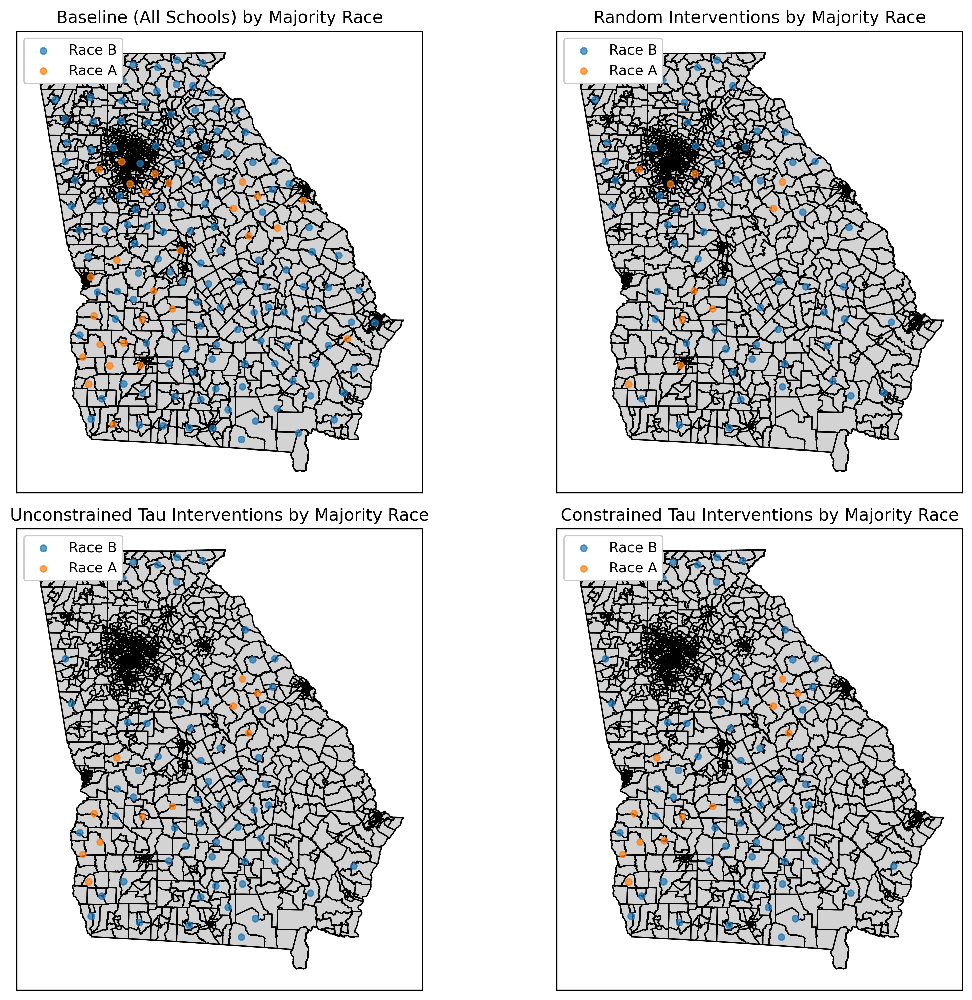

Combined map plot saved
The map visualization compares four intervention strategies:
1. Baseline: All schools without interventions, showing the majority race distribution.
2. Random Interventions: Randomly selected schools with interventions.
3. Unconstrained Tau: Schools chosen for interventions under an unconstrained strategy.
4. Constrained Tau: Schools chosen for interventions under a constrained strategy.
Each map highlights the distribution of majority races (Race A, B, etc.) for the respective intervention strategy.


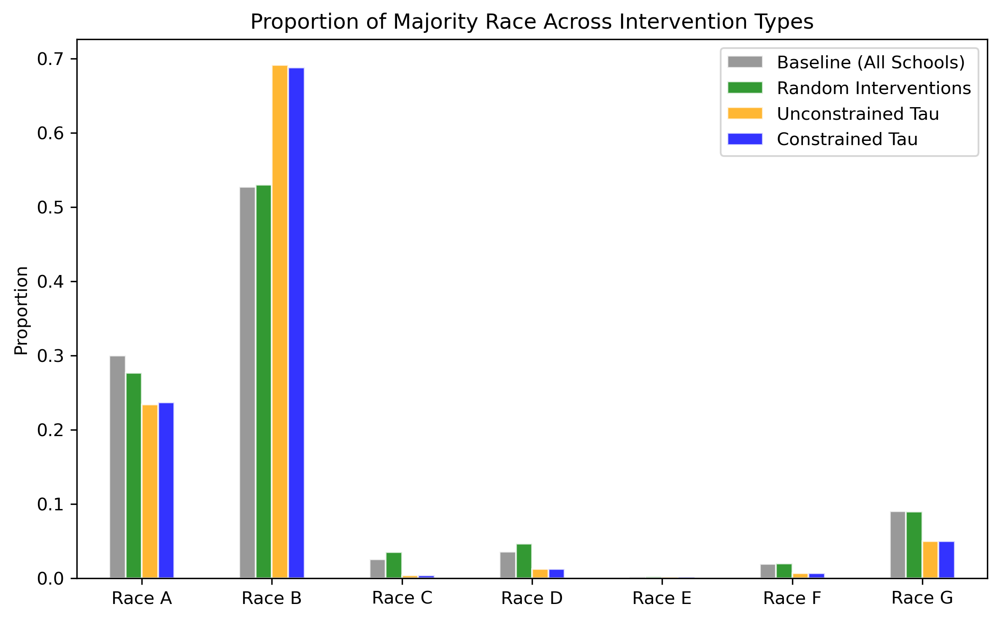

Race proportions comparison plot saved
The bar chart visualizes the proportions of majority races (Race A, B, etc.) across four strategies:
1. Baseline: Distribution for all schools.
2. Random Interventions: Distribution for randomly selected intervention schools.
3. Unconstrained Tau: Distribution for schools chosen under an unconstrained strategy.
4. Constrained Tau: Distribution for schools chosen under a constrained strategy.
This chart highlights the variation in racial distribution for each intervention strategy.


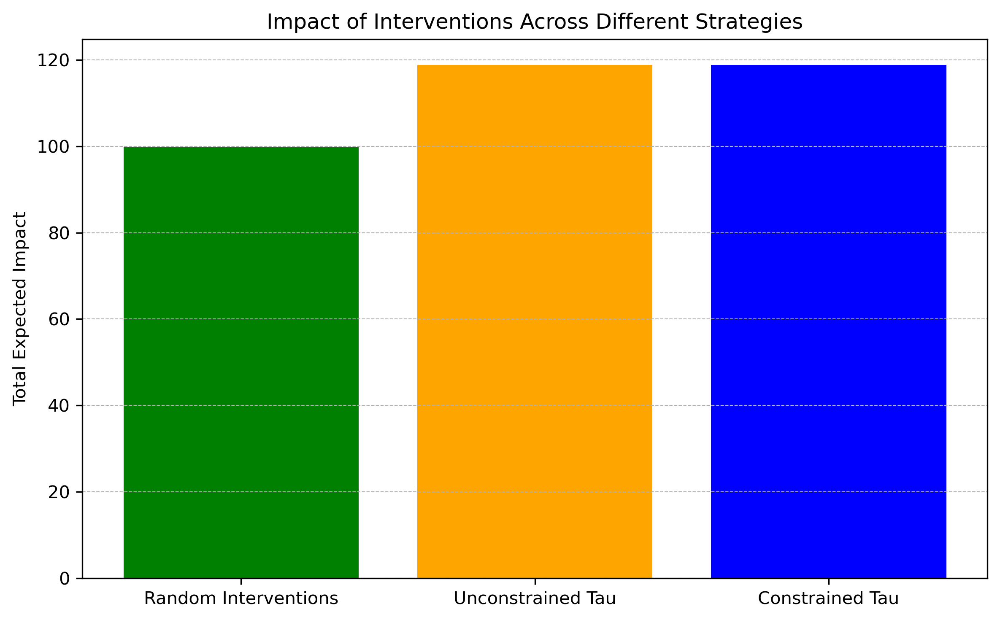

Impact comparison plot saved
The impact plot compares the total expected impact for four intervention strategies:
1. Baseline: Impact with no interventions applied.
2. Random Interventions: Impact when interventions are randomly assigned.
3. Unconstrained Tau: Impact under an unconstrained intervention strategy.
4. Constrained Tau: Impact under a constrained intervention strategy.
This plot quantifies the effectiveness of each strategy in improving total expected impact.


In [30]:
# Separate schools into unique and common groups
all_schools_baseline = school_df
unique_to_random = school_df[random_interventions == 1]
unique_to_unconstrained = school_df[optimal_interventions_unconstrained == 1]
unique_to_constrained = school_df[optimal_interventions_constrained == 1]

# Function to plot a single map
def plot_map(ax, title, schools):
    # boroughs = gpd.read_file(get_path("nybb")).to_crs("EPSG:4326")
    boroughs = gpd.read_file(r'./dataset/ga_map/tl_2009_13_tract00.shp').to_crs("EPSG:4326")
    boroughs.plot(ax=ax, color='lightgray', edgecolor='black')
    for race in school_df['majority_race'].unique():
        data = schools[schools['majority_race'] == race]
        ax.scatter(data['longitude'], data['latitude'], label=f"Race {race[-1]}", alpha=0.7, s=20)
    ax.set_title(title)
    ax.legend(loc='upper left', framealpha=1)
    ax.set_xticks([])
    ax.set_yticks([])

# Combined map plot
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 10), dpi=300)
axes = axes.ravel()

plot_map(axes[0], "Baseline (All Schools) by Majority Race", all_schools_baseline)
plot_map(axes[1], "Random Interventions by Majority Race", unique_to_random)
plot_map(axes[2], "Unconstrained Tau Interventions by Majority Race", unique_to_unconstrained)
plot_map(axes[3], "Constrained Tau Interventions by Majority Race", unique_to_constrained)

plt.tight_layout()
# combined_map_path = os.path.join(results_folder, "intervention_maps_comparison.png")
plt.savefig('results/intervention_maps_comparison.png')
plt.show()
print(f"Combined map plot saved")

# Detailed description for the combined map plot
print(
    "The map visualization compares four intervention strategies:\n"
    "1. Baseline: All schools without interventions, showing the majority race distribution.\n"
    "2. Random Interventions: Randomly selected schools with interventions.\n"
    "3. Unconstrained Tau: Schools chosen for interventions under an unconstrained strategy.\n"
    "4. Constrained Tau: Schools chosen for interventions under a constrained strategy.\n"
    "Each map highlights the distribution of majority races (Race A, B, etc.) for the respective intervention strategy."
)

# Bar plots for race proportions
fig, ax = plt.subplots(figsize=(8, 5), dpi=300)

# Race proportion calculations
baseline_counts = all_schools_baseline[race_columns].sum(axis=0)
baseline_freq = baseline_counts / baseline_counts.sum()

random_counts = unique_to_random[race_columns].sum(axis=0)
random_freq = random_counts / random_counts.sum()

unconstrained_counts = unique_to_unconstrained[race_columns].sum(axis=0)
unconstrained_freq = unconstrained_counts / unconstrained_counts.sum()

constrained_counts = unique_to_constrained[race_columns].sum(axis=0)
constrained_freq = constrained_counts / constrained_counts.sum()

# Combine data for plotting
race_df = pd.concat(
    (baseline_freq, random_freq, unconstrained_freq, constrained_freq),
    axis=1
)
race_df.columns = ['Baseline (All Schools)', 'Random Interventions', 'Unconstrained Tau', 'Constrained Tau']
race_df.index = [f"Race {col[-1]}" for col in race_columns]

# Plot bar chart
race_df.plot.bar(ax=ax, rot=0, color=['gray', 'green', 'orange', 'blue'], edgecolor='white', alpha=0.8)
ax.set_ylabel('Proportion')
ax.set_title('Proportion of Majority Race Across Intervention Types')
plt.legend(loc='upper right')
plt.tight_layout()

# Show plot and save it
# bar_plot_path = os.path.join(results_folder, "race_proportions_comparison.png")
plt.savefig('results/race_proportions_comparison.png')
plt.show()
print(f"Race proportions comparison plot saved")

# Detailed description for the bar plot
print(
    "The bar chart visualizes the proportions of majority races (Race A, B, etc.) across four strategies:\n"
    "1. Baseline: Distribution for all schools.\n"
    "2. Random Interventions: Distribution for randomly selected intervention schools.\n"
    "3. Unconstrained Tau: Distribution for schools chosen under an unconstrained strategy.\n"
    "4. Constrained Tau: Distribution for schools chosen under a constrained strategy.\n"
    "This chart highlights the variation in racial distribution for each intervention strategy."
)

# Impact plot

# Calculate impacts
null_array = np.full(NUM_SCHOOLS, np.nan)
baseline_impact = expected_impact(null_array)
random_impact = expected_impact(random_interventions)
unconstrained_impact = expected_impact(optimal_interventions_unconstrained)
constrained_impact = expected_impact(optimal_interventions_constrained)

fig, ax = plt.subplots(figsize=(8, 5), dpi=300)
labels = ['Baseline', 'Random Interventions', 'Unconstrained Tau', 'Constrained Tau']
values = [baseline_impact, random_impact, unconstrained_impact, constrained_impact]

ax.bar(labels, values, color=['gray', 'green', 'orange', 'blue'])
ax.set_ylabel('Total Expected Impact')
ax.set_title('Impact of Interventions Across Different Strategies')
ax.grid(axis='y', linestyle='--', linewidth=0.5)
plt.tight_layout()

# impact_plot_path = os.path.join(results_folder, "impact_comparison.png")
plt.savefig('results/impact_comparison.png')
plt.show()
print(f"Impact comparison plot saved")

# Detailed description for the impact plot
print(
    "The impact plot compares the total expected impact for four intervention strategies:\n"
    "1. Baseline: Impact with no interventions applied.\n"
    "2. Random Interventions: Impact when interventions are randomly assigned.\n"
    "3. Unconstrained Tau: Impact under an unconstrained intervention strategy.\n"
    "4. Constrained Tau: Impact under a constrained intervention strategy.\n"
    "This plot quantifies the effectiveness of each strategy in improving total expected impact."
)


In [2]:
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import os
from geodatasets import get_path

D:\apps\anaconda\Lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated and will be removed in a future release
  "class": algorithms.Blowfish,


In [3]:
# File paths for different tau values
constrained_paths = {
    0.43: 'results/budget130_tau_0.43.npy',
    0.75: 'results/budget130_tau_0.75.npy',
    None: 'results/budget130_tau_None.npy'
}

# Load data for all tau values
optimal_interventions = {}
for tau, path in constrained_paths.items():
    optimal_interventions[tau] = np.load(path)

# Generate random interventions with the same count as Constrained Tau for tau = 0.43
num_random_interventions = optimal_interventions[0.43].sum()
random_interventions = np.zeros(NUM_SCHOOLS, dtype=int)
random_indices = np.random.choice(NUM_SCHOOLS, size=num_random_interventions, replace=False)
random_interventions[random_indices] = 1

print(f"Constrained Tau 0.43 Interventions: {optimal_interventions[0.43].sum()}")
print(f"Constrained Tau 0.75 Interventions: {optimal_interventions[0.75].sum()}")
print(f"Unconstrained Tau Interventions: {optimal_interventions[None].sum()}")
print(f"Random Interventions: {random_interventions.sum()}")

# Separate schools into unique groups for each tau value
unique_to_random = school_df[random_interventions == 1]
unique_to_unconstrained = school_df[optimal_interventions[None] == 1]
unique_to_constrained_043 = school_df[optimal_interventions[0.43] == 1]
unique_to_constrained_075 = school_df[optimal_interventions[0.75] == 1]

# Function to plot a single map
def plot_map(ax, title, schools):
    boroughs = gpd.read_file(r'./dataset/ga_map/tl_2009_13_tract00.shp').to_crs("EPSG:4326")
    boroughs.plot(ax=ax, color='lightgray', edgecolor='black')
    for race in school_df['majority_race'].unique():
        data = schools[schools['majority_race'] == race]
        ax.scatter(data['longitude'], data['latitude'], label=f"Race {race[-1]}", alpha=0.7, s=20)
    ax.set_title(title)
    ax.legend(loc='upper left', framealpha=1)
    ax.set_xticks([])
    ax.set_yticks([])

# Combined map plot
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 10), dpi=300)
axes = axes.ravel()

plot_map(axes[0], "Baseline (All Schools) by Majority Race", all_schools_baseline)
plot_map(axes[1], "Random Interventions by Majority Race", unique_to_random)
plot_map(axes[2], "Unconstrained Tau by Majority Race", unique_to_unconstrained)
plot_map(axes[3], "Constrained Tau 0.43 by Majority Race", unique_to_constrained_043)
plot_map(axes[4], "Constrained Tau 0.75 by Majority Race", unique_to_constrained_075)

plt.tight_layout()
plt.savefig('results/intervention_maps_comparison.png')
plt.show()
print(f"Combined map plot saved")

# Bar plots for race proportions across different tau values
fig, ax = plt.subplots(figsize=(8, 5), dpi=300)

# Race proportion calculations
def calculate_race_proportions(df, race_columns):
    counts = df[race_columns].sum(axis=0)
    return counts / counts.sum()

race_proportions = {
    'Baseline': calculate_race_proportions(all_schools_baseline, race_columns),
    'Random Interventions': calculate_race_proportions(unique_to_random, race_columns),
    'Unconstrained Tau': calculate_race_proportions(unique_to_unconstrained, race_columns),
    'Constrained Tau 0.43': calculate_race_proportions(unique_to_constrained_043, race_columns),
    'Constrained Tau 0.75': calculate_race_proportions(unique_to_constrained_075, race_columns)
}

# Combine data for plotting
race_df = pd.DataFrame(race_proportions)
race_df.index = [f"Race {col[-1]}" for col in race_columns]

# Plot bar chart
race_df.plot.bar(ax=ax, rot=0, color=['gray', 'green', 'orange', 'blue', 'purple'], edgecolor='white', alpha=0.8)
ax.set_ylabel('Proportion')
ax.set_title('Proportion of Majority Race Across Intervention Types')
plt.legend(loc='upper right')
plt.tight_layout()

plt.savefig('results/race_proportions_comparison.png')
plt.show()
print(f"Race proportions comparison plot saved")

# Impact plot across different tau values

# Function to calculate impact for each intervention strategy
def calculate_impact(intervention_array):
    return expected_impact(intervention_array)

# Calculate impacts for each strategy
impacts = {
    'Baseline': calculate_impact(np.full(NUM_SCHOOLS, np.nan)),
    'Random Interventions': calculate_impact(random_interventions),
    'Unconstrained Tau': calculate_impact(optimal_interventions[None]),
    'Constrained Tau 0.43': calculate_impact(optimal_interventions[0.43]),
    'Constrained Tau 0.75': calculate_impact(optimal_interventions[0.75])
}

# Plot impact comparison
fig, ax = plt.subplots(figsize=(8, 5), dpi=300)
labels = list(impacts.keys())
values = list(impacts.values())

ax.bar(labels, values, color=['gray', 'green', 'orange', 'blue', 'purple'])
ax.set_ylabel('Total Expected Impact')
ax.set_title('Impact of Interventions Across Different Strategies')
ax.grid(axis='y', linestyle='--', linewidth=0.5)
plt.tight_layout()

plt.savefig('results/impact_comparison.png')
plt.show()
print(f"Impact comparison plot saved")


NameError: name 'NUM_SCHOOLS' is not defined

Constrained Tau (0.43) Interventions: 70
Constrained Tau (0.75) Interventions: 70
Unconstrained Tau Interventions: 70
Random Interventions: 70


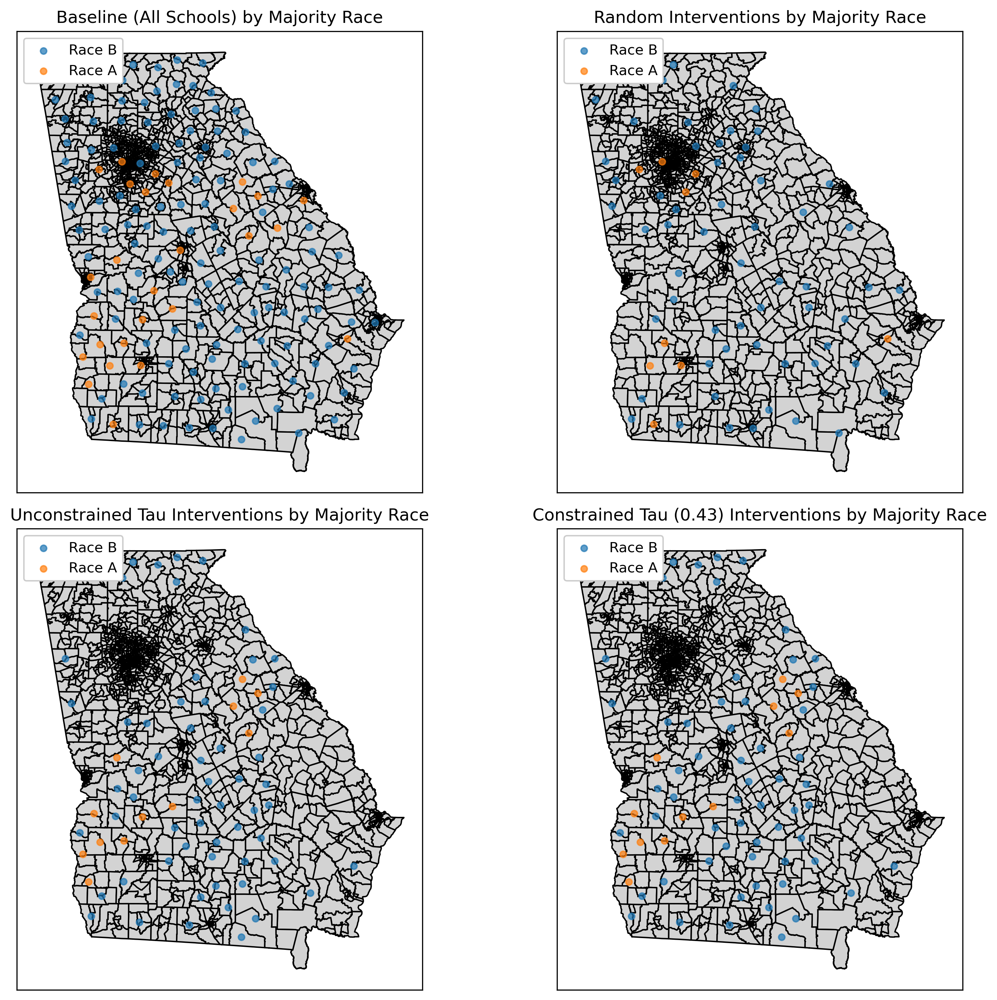

Combined map plot saved


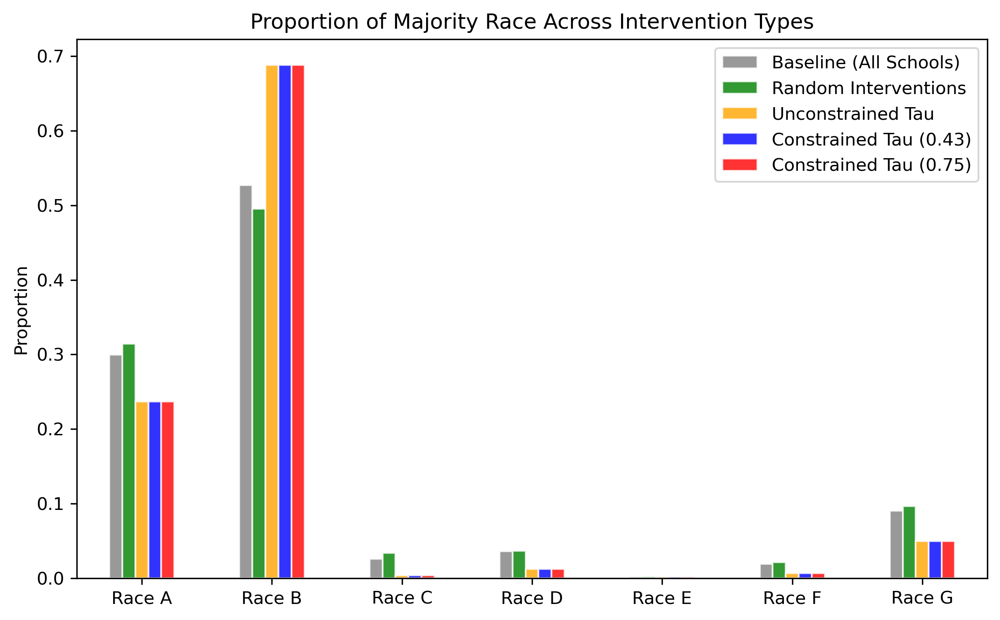

Race proportions comparison plot saved


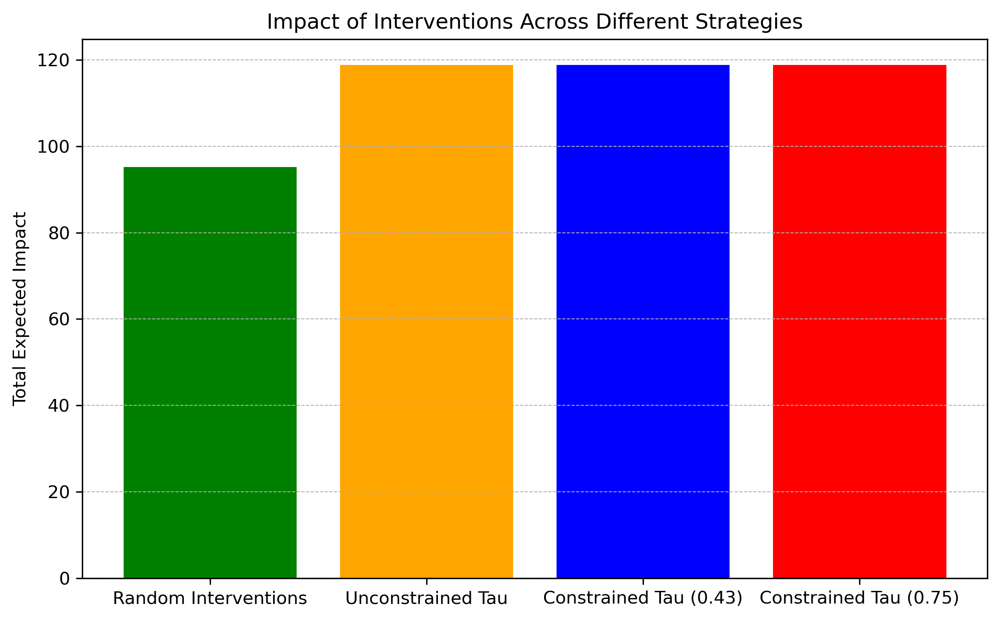

Impact comparison plot saved


In [6]:
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import os
from geodatasets import get_path

# Create results folder if it doesn't exist
results_folder = "results"
os.makedirs(results_folder, exist_ok=True)

# File paths for tau values
constrained_path_0_43 = 'results/budget130_tau_0.43.npy'
constrained_path_0_75 = 'results/budget130_tau_0.75.npy'
unconstrained_path = 'results/budget130_tau_None.npy'

# Load data for tau = 0.43, tau = 0.75, and tau = None
optimal_interventions_constrained_0_43 = np.load(constrained_path_0_43)
optimal_interventions_constrained_0_75 = np.load(constrained_path_0_75)
optimal_interventions_unconstrained = np.load(unconstrained_path)
school_df = pd.read_csv('GA_features.csv')
neighbor_index_matrix = np.load('index_matrix.npy')
neighbor_distance_matrix = np.load('distance_matrix.npy')

# Constants
NUM_SCHOOLS = school_df.shape[0]
race_columns = ['registered_A', 'registered_B', 'registered_C', 'registered_D', 'registered_E', 'registered_F', 'registered_G']

# Add majority race column
school_df['majority_race'] = school_df[race_columns].idxmax(axis=1)
school_df['majority_race'] = school_df['majority_race'].str[2:]  # Remove 'n_' prefix

# Generate random interventions with the same count as Constrained Tau (for tau = 0.43)
num_random_interventions = optimal_interventions_constrained_0_43.sum()
random_interventions = np.zeros(NUM_SCHOOLS, dtype=int)
random_indices = np.random.choice(NUM_SCHOOLS, size=num_random_interventions, replace=False)
random_interventions[random_indices] = 1

print(f"Constrained Tau (0.43) Interventions: {optimal_interventions_constrained_0_43.sum()}")
print(f"Constrained Tau (0.75) Interventions: {optimal_interventions_constrained_0_75.sum()}")
print(f"Unconstrained Tau Interventions: {optimal_interventions_unconstrained.sum()}")
print(f"Random Interventions: {random_interventions.sum()}")

# Import parameters 
params = pd.read_csv('results/params.csv')
# Extract weight vectors
ALPHA = params['alpha'].values
BETA = params['beta'].values
GAMMA = params['gamma'].values
DELTA = params['delta'].values
THETA = params['theta'].values

# Load neighborhood matrices
NEIGHBOR_INDEX_MATRIX = np.load('index_matrix.npy')
NEIGHBOR_DISTANCE_MATRIX = np.load('distance_matrix.npy')

df = pd.read_csv('GA_features.csv')
contribution = df['contribution'].values
n_poll = df['n_poll'].values
tweets = df['tweets'].values

# Optimization Helper
def expected_impact_i(index, intervention_array):
    """
    Calculate the expected impact for a given index, intervention array, and demographic vector.
    """
    racial_prop = ['frac_registered_A', 'frac_registered_B', 'frac_registered_C', 'frac_registered_D', 
                   'frac_registered_E', 'frac_registered_F', 'frac_registered_G']
    demographic_vector = df.loc[index,  racial_prop]
    
    # Get nearest neighbors and distances for the given index
    nearest_neighbors = neighbor_index_matrix[index, :]
    neighbor_distances = neighbor_distance_matrix[index, nearest_neighbors]
    
    # Compute terms for each feature using the revised features and weights
    frac_unem_term = np.dot(demographic_vector, ALPHA) * np.max(neighbor_distances * intervention_array)
    n_poll_term = np.dot(demographic_vector, BETA) * np.max(neighbor_distances * n_poll[nearest_neighbors])
    contribution_term = np.dot(demographic_vector, GAMMA) * np.max(neighbor_distances * contribution[nearest_neighbors])
    tweets_term = np.dot(demographic_vector, DELTA) * np.max(neighbor_distances * tweets[nearest_neighbors])
    demographic_term = np.dot(demographic_vector, THETA)

    # Calculate total impact
    impact = frac_unem_term + n_poll_term + contribution_term + tweets_term + demographic_term
    
    # Clamp impact between 0 and 1
    return max(min(impact, 1), 0)

def expected_impact(intervention_array):
    impact = 0
    for i in range(len(intervention_array)):
        impact += expected_impact_i(i, intervention_array[i])
    return impact

# Separate schools into unique and common groups
all_schools_baseline = school_df
unique_to_random = school_df[random_interventions == 1]
unique_to_unconstrained = school_df[optimal_interventions_unconstrained == 1]
unique_to_constrained_0_43 = school_df[optimal_interventions_constrained_0_43 == 1]
unique_to_constrained_0_75 = school_df[optimal_interventions_constrained_0_75 == 1]

# Function to plot a single map
def plot_map(ax, title, schools):
    boroughs = gpd.read_file(r'./ga_map/tl_2009_13_tract00.shp').to_crs("EPSG:4326")
    boroughs.plot(ax=ax, color='lightgray', edgecolor='black')
    for race in school_df['majority_race'].unique():
        data = schools[schools['majority_race'] == race]
        ax.scatter(data['longitude'], data['latitude'], label=f"Race {race[-1]}", alpha=0.7, s=20)
    ax.set_title(title)
    ax.legend(loc='upper left', framealpha=1)
    ax.set_xticks([])
    ax.set_yticks([])

# Combined map plot
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 10), dpi=300)
axes = axes.ravel()

plot_map(axes[0], "Baseline (All Schools) by Majority Race", all_schools_baseline)
plot_map(axes[1], "Random Interventions by Majority Race", unique_to_random)
plot_map(axes[2], "Unconstrained Tau Interventions by Majority Race", unique_to_unconstrained)
plot_map(axes[3], "Constrained Tau (0.43) Interventions by Majority Race", unique_to_constrained_0_43)

plt.tight_layout()
plt.savefig('results/intervention_maps_comparison.png')
plt.show()
print(f"Combined map plot saved")

# Bar plots for race proportions
fig, ax = plt.subplots(figsize=(8, 5), dpi=300)

# Race proportion calculations
baseline_counts = all_schools_baseline[race_columns].sum(axis=0)
baseline_freq = baseline_counts / baseline_counts.sum()

random_counts = unique_to_random[race_columns].sum(axis=0)
random_freq = random_counts / random_counts.sum()

unconstrained_counts = unique_to_unconstrained[race_columns].sum(axis=0)
unconstrained_freq = unconstrained_counts / unconstrained_counts.sum()

constrained_0_43_counts = unique_to_constrained_0_43[race_columns].sum(axis=0)
constrained_0_43_freq = constrained_0_43_counts / constrained_0_43_counts.sum()

constrained_0_75_counts = unique_to_constrained_0_75[race_columns].sum(axis=0)
constrained_0_75_freq = constrained_0_75_counts / constrained_0_75_counts.sum()

# Combine data for plotting
race_df = pd.concat(
    (baseline_freq, random_freq, unconstrained_freq, constrained_0_43_freq, constrained_0_75_freq),
    axis=1
)
race_df.columns = ['Baseline (All Schools)', 'Random Interventions', 'Unconstrained Tau', 'Constrained Tau (0.43)', 'Constrained Tau (0.75)']
race_df.index = [f"Race {col[-1]}" for col in race_columns]

# Plot bar chart
race_df.plot.bar(ax=ax, rot=0, color=['gray', 'green', 'orange', 'blue', 'red'], edgecolor='white', alpha=0.8)
ax.set_ylabel('Proportion')
ax.set_title('Proportion of Majority Race Across Intervention Types')
plt.legend(loc='upper right')
plt.tight_layout()

plt.savefig('results/race_proportions_comparison.png')
plt.show()
print(f"Race proportions comparison plot saved")

# Impact plot

# Calculate impacts
null_array = np.full(NUM_SCHOOLS, np.nan)
baseline_impact = expected_impact(null_array)
random_impact = expected_impact(random_interventions)
unconstrained_impact = expected_impact(optimal_interventions_unconstrained)
constrained_impact_0_43 = expected_impact(optimal_interventions_constrained_0_43)
constrained_impact_0_75 = expected_impact(optimal_interventions_constrained_0_75)

fig, ax = plt.subplots(figsize=(8, 5), dpi=300)
labels = ['Baseline', 'Random Interventions', 'Unconstrained Tau', 'Constrained Tau (0.43)', 'Constrained Tau (0.75)']
values = [baseline_impact, random_impact, unconstrained_impact, constrained_impact_0_43, constrained_impact_0_75]

ax.bar(labels, values, color=['gray', 'green', 'orange', 'blue', 'red'])
ax.set_ylabel('Total Expected Impact')
ax.set_title('Impact of Interventions Across Different Strategies')
ax.grid(axis='y', linestyle='--', linewidth=0.5)
plt.tight_layout()

plt.savefig('results/impact_comparison.png')
plt.show()
print(f"Impact comparison plot saved")


Constrained Tau (0.43) Interventions: 70
Constrained Tau (0.75) Interventions: 70
Unconstrained Tau Interventions: 70
Random Interventions: 70


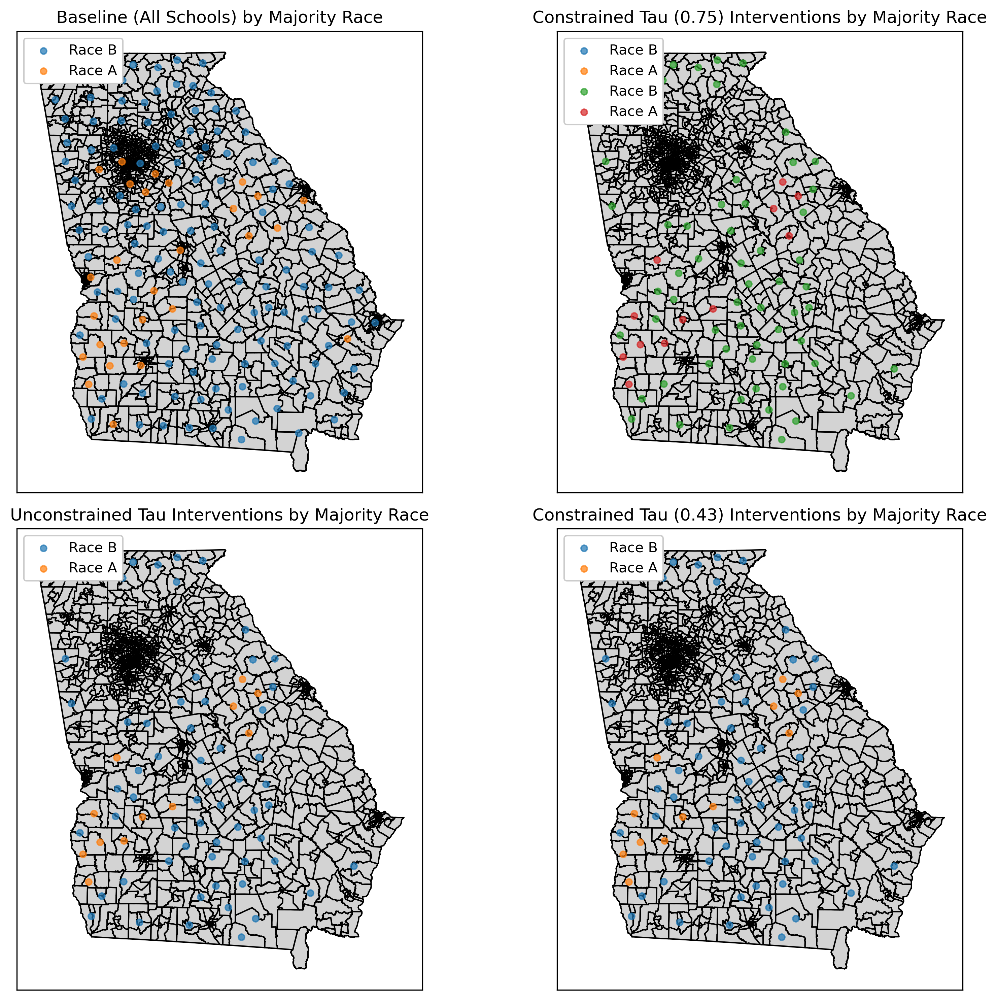

Combined map plot saved


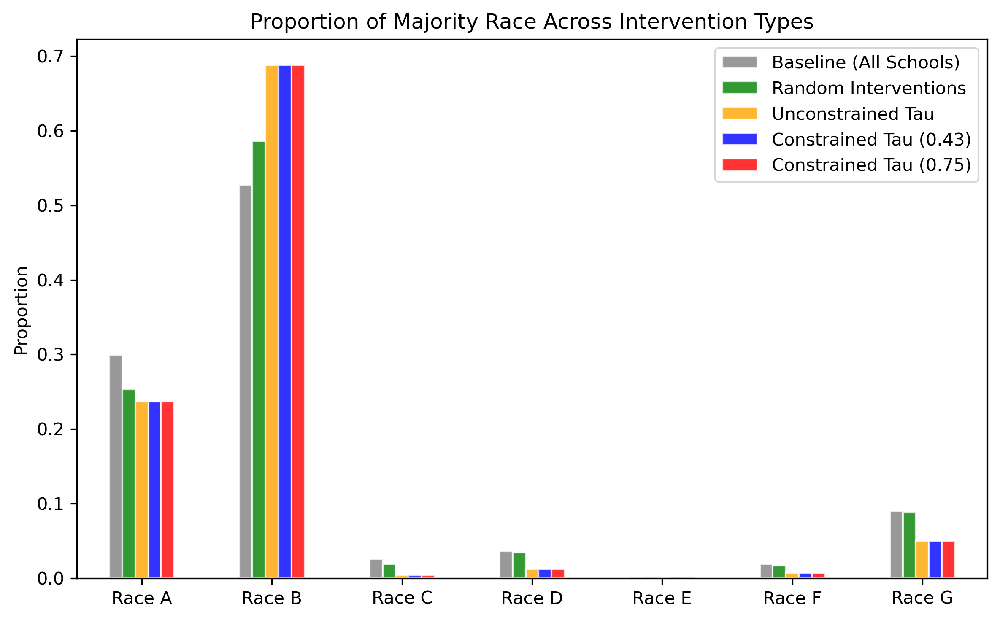

Race proportions comparison plot saved


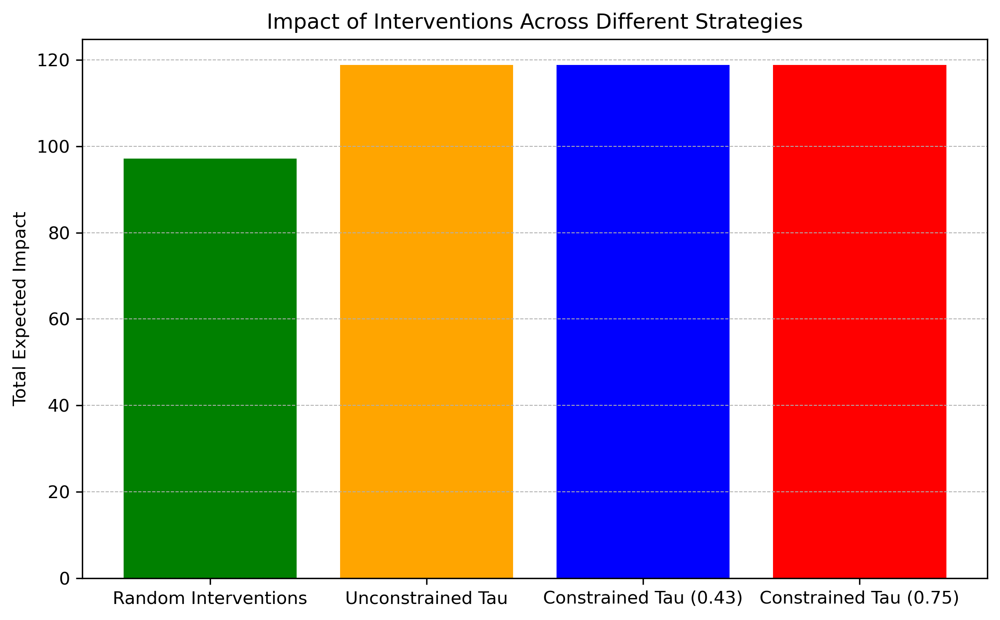

Impact comparison plot saved


In [10]:
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import os
from geodatasets import get_path

# Create results folder if it doesn't exist
results_folder = "results"
os.makedirs(results_folder, exist_ok=True)

# File paths for tau values
constrained_path_0_43 = 'results/budget130_tau_0.43.npy'
constrained_path_0_75 = 'results/budget130_tau_0.75.npy'
unconstrained_path = 'results/budget130_tau_None.npy'

# Load data for tau = 0.43, tau = 0.75, and tau = None
optimal_interventions_constrained_0_43 = np.load(constrained_path_0_43)
optimal_interventions_constrained_0_75 = np.load(constrained_path_0_75)
optimal_interventions_unconstrained = np.load(unconstrained_path)
school_df = pd.read_csv('GA_features.csv')
neighbor_index_matrix = np.load('index_matrix.npy')
neighbor_distance_matrix = np.load('distance_matrix.npy')

# Constants
NUM_SCHOOLS = school_df.shape[0]
race_columns = ['registered_A', 'registered_B', 'registered_C', 'registered_D', 'registered_E', 'registered_F', 'registered_G']

# Add majority race column
school_df['majority_race'] = school_df[race_columns].idxmax(axis=1)
school_df['majority_race'] = school_df['majority_race'].str[2:]  # Remove 'n_' prefix

# Generate random interventions with the same count as Constrained Tau (for tau = 0.43)
num_random_interventions = optimal_interventions_constrained_0_43.sum()
random_interventions = np.zeros(NUM_SCHOOLS, dtype=int)
random_indices = np.random.choice(NUM_SCHOOLS, size=num_random_interventions, replace=False)
random_interventions[random_indices] = 1

print(f"Constrained Tau (0.43) Interventions: {optimal_interventions_constrained_0_43.sum()}")
print(f"Constrained Tau (0.75) Interventions: {optimal_interventions_constrained_0_75.sum()}")
print(f"Unconstrained Tau Interventions: {optimal_interventions_unconstrained.sum()}")
print(f"Random Interventions: {random_interventions.sum()}")

# Import parameters 
params = pd.read_csv('results/params.csv')
# Extract weight vectors
ALPHA = params['alpha'].values
BETA = params['beta'].values
GAMMA = params['gamma'].values
DELTA = params['delta'].values
THETA = params['theta'].values

# Load neighborhood matrices
NEIGHBOR_INDEX_MATRIX = np.load('index_matrix.npy')
NEIGHBOR_DISTANCE_MATRIX = np.load('distance_matrix.npy')

df = pd.read_csv('GA_features.csv')
contribution = df['contribution'].values
n_poll = df['n_poll'].values
tweets = df['tweets'].values

# Optimization Helper
def expected_impact_i(index, intervention_array):
    """
    Calculate the expected impact for a given index, intervention array, and demographic vector.
    """
    racial_prop = ['frac_registered_A', 'frac_registered_B', 'frac_registered_C', 'frac_registered_D', 
                   'frac_registered_E', 'frac_registered_F', 'frac_registered_G']
    demographic_vector = df.loc[index,  racial_prop]
    
    # Get nearest neighbors and distances for the given index
    nearest_neighbors = neighbor_index_matrix[index, :]
    neighbor_distances = neighbor_distance_matrix[index, nearest_neighbors]
    
    # Compute terms for each feature using the revised features and weights
    frac_unem_term = np.dot(demographic_vector, ALPHA) * np.max(neighbor_distances * intervention_array)
    n_poll_term = np.dot(demographic_vector, BETA) * np.max(neighbor_distances * n_poll[nearest_neighbors])
    contribution_term = np.dot(demographic_vector, GAMMA) * np.max(neighbor_distances * contribution[nearest_neighbors])
    tweets_term = np.dot(demographic_vector, DELTA) * np.max(neighbor_distances * tweets[nearest_neighbors])
    demographic_term = np.dot(demographic_vector, THETA)

    # Calculate total impact
    impact = frac_unem_term + n_poll_term + contribution_term + tweets_term + demographic_term
    
    # Clamp impact between 0 and 1
    return max(min(impact, 1), 0)

def expected_impact(intervention_array):
    impact = 0
    for i in range(len(intervention_array)):
        impact += expected_impact_i(i, intervention_array[i])
    return impact

# Separate schools into unique and common groups
all_schools_baseline = school_df
unique_to_random = school_df[random_interventions == 1]
unique_to_unconstrained = school_df[optimal_interventions_unconstrained == 1]
unique_to_constrained_0_43 = school_df[optimal_interventions_constrained_0_43 == 1]
unique_to_constrained_0_75 = school_df[optimal_interventions_constrained_0_75 == 1]

# Function to plot a single map
def plot_map(ax, title, schools):
    boroughs = gpd.read_file(r'./ga_map/tl_2009_13_tract00.shp').to_crs("EPSG:4326")
    boroughs.plot(ax=ax, color='lightgray', edgecolor='black')
    for race in school_df['majority_race'].unique():
        data = schools[schools['majority_race'] == race]
        ax.scatter(data['longitude'], data['latitude'], label=f"Race {race[-1]}", alpha=0.7, s=20)
    ax.set_title(title)
    ax.legend(loc='upper left', framealpha=1)
    ax.set_xticks([])
    ax.set_yticks([])

# Combined map plot
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 10), dpi=300)
axes = axes.ravel()

plot_map(axes[0], "Baseline (All Schools) by Majority Race", all_schools_baseline)
plot_map(axes[1], "Random Interventions by Majority Race", unique_to_random)
plot_map(axes[2], "Unconstrained Tau Interventions by Majority Race", unique_to_unconstrained)
plot_map(axes[3], "Constrained Tau (0.43) Interventions by Majority Race", unique_to_constrained_0_43)
plot_map(axes[1], "Constrained Tau (0.75) Interventions by Majority Race", unique_to_constrained_0_75)  # Added for tau = 0.75

plt.tight_layout()
plt.savefig('results/intervention_maps_comparison.png')
plt.show()
print(f"Combined map plot saved")

# Bar plots for race proportions
fig, ax = plt.subplots(figsize=(8, 5), dpi=300)

# Race proportion calculations
baseline_counts = all_schools_baseline[race_columns].sum(axis=0)
baseline_freq = baseline_counts / baseline_counts.sum()

random_counts = unique_to_random[race_columns].sum(axis=0)
random_freq = random_counts / random_counts.sum()

unconstrained_counts = unique_to_unconstrained[race_columns].sum(axis=0)
unconstrained_freq = unconstrained_counts / unconstrained_counts.sum()

constrained_0_43_counts = unique_to_constrained_0_43[race_columns].sum(axis=0)
constrained_0_43_freq = constrained_0_43_counts / constrained_0_43_counts.sum()

constrained_0_75_counts = unique_to_constrained_0_75[race_columns].sum(axis=0)
constrained_0_75_freq = constrained_0_75_counts / constrained_0_75_counts.sum()

# Combine data for plotting
race_df = pd.concat(
    (baseline_freq, random_freq, unconstrained_freq, constrained_0_43_freq, constrained_0_75_freq),
    axis=1
)
race_df.columns = ['Baseline (All Schools)', 'Random Interventions', 'Unconstrained Tau', 'Constrained Tau (0.43)', 'Constrained Tau (0.75)']
race_df.index = [f"Race {col[-1]}" for col in race_columns]

# Plot bar chart
race_df.plot.bar(ax=ax, rot=0, color=['gray', 'green', 'orange', 'blue', 'red'], edgecolor='white', alpha=0.8)
ax.set_ylabel('Proportion')
ax.set_title('Proportion of Majority Race Across Intervention Types')
plt.legend(loc='upper right')
plt.tight_layout()

plt.savefig('results/race_proportions_comparison.png')
plt.show()
print(f"Race proportions comparison plot saved")

# Impact plot

# Calculate impacts
null_array = np.full(NUM_SCHOOLS, np.nan)
baseline_impact = expected_impact(null_array)
random_impact = expected_impact(random_interventions)
unconstrained_impact = expected_impact(optimal_interventions_unconstrained)
constrained_impact_0_43 = expected_impact(optimal_interventions_constrained_0_43)
constrained_impact_0_75 = expected_impact(optimal_interventions_constrained_0_75)

fig, ax = plt.subplots(figsize=(8, 5), dpi=300)
labels = ['Baseline', 'Random Interventions', 'Unconstrained Tau', 'Constrained Tau (0.43)', 'Constrained Tau (0.75)']
values = [baseline_impact, random_impact, unconstrained_impact, constrained_impact_0_43, constrained_impact_0_75]

ax.bar(labels, values, color=['gray', 'green', 'orange', 'blue', 'red'])
ax.set_ylabel('Total Expected Impact')
ax.set_title('Impact of Interventions Across Different Strategies')
ax.grid(axis='y', linestyle='--', linewidth=0.5)
plt.tight_layout()

plt.savefig('results/impact_comparison.png')
plt.show()
print(f"Impact comparison plot saved")


Constrained Tau (0.43) Interventions: 70
Constrained Tau (0.75) Interventions: 70
Unconstrained Tau Interventions: 70
Random Interventions: 70


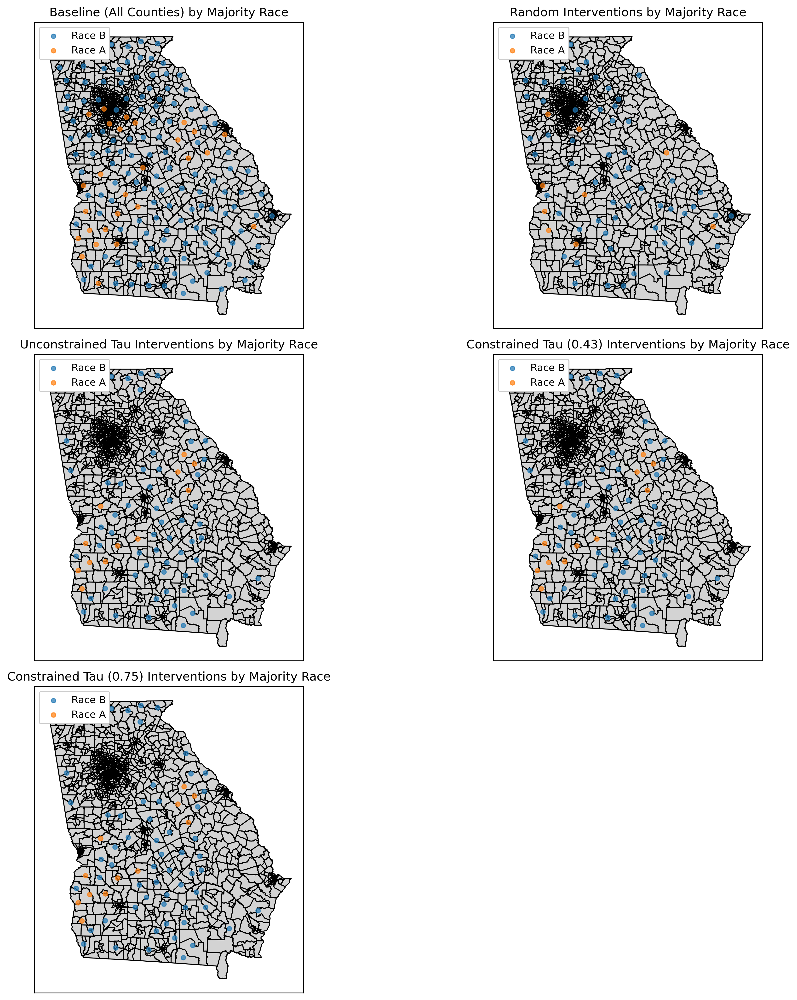

Combined map plot saved


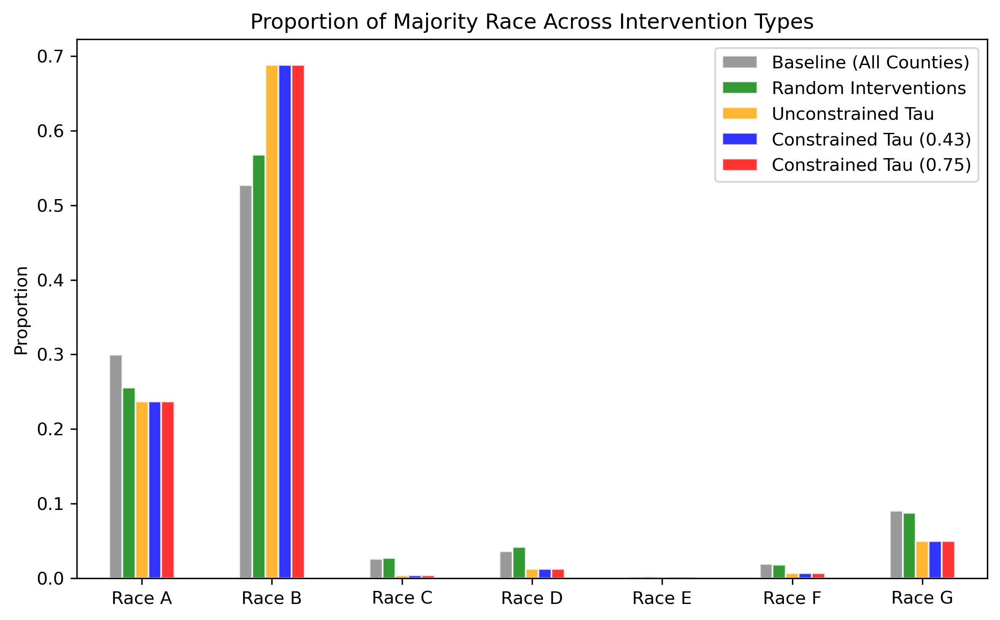

Race proportions comparison plot saved


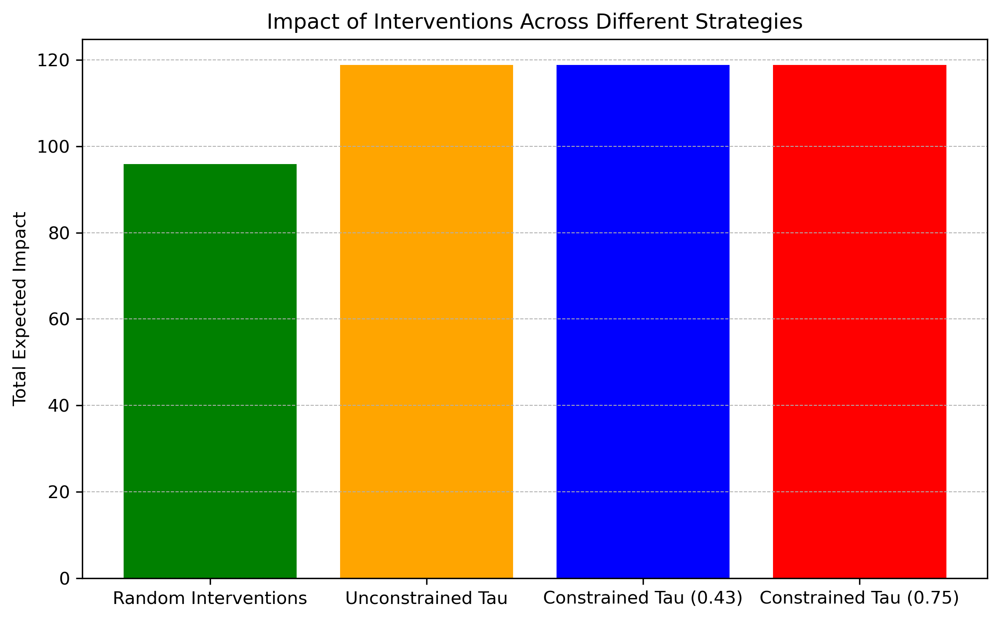

Impact comparison plot saved


In [14]:
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import os
from geodatasets import get_path

# Create results folder if it doesn't exist
results_folder = "results"
os.makedirs(results_folder, exist_ok=True)

# File paths for tau values
constrained_path_0_43 = 'results/budget130_tau_0.43.npy'
constrained_path_0_75 = 'results/budget130_tau_0.75.npy'
unconstrained_path = 'results/budget130_tau_None.npy'

# Load data for tau = 0.43, tau = 0.75, and tau = None
optimal_interventions_constrained_0_43 = np.load(constrained_path_0_43)
optimal_interventions_constrained_0_75 = np.load(constrained_path_0_75)
optimal_interventions_unconstrained = np.load(unconstrained_path)
school_df = pd.read_csv('GA_features.csv')
neighbor_index_matrix = np.load('index_matrix.npy')
neighbor_distance_matrix = np.load('distance_matrix.npy')

# Constants
NUM_SCHOOLS = school_df.shape[0]
race_columns = ['registered_A', 'registered_B', 'registered_C', 'registered_D', 'registered_E', 'registered_F', 'registered_G']

# Add majority race column
school_df['majority_race'] = school_df[race_columns].idxmax(axis=1)
school_df['majority_race'] = school_df['majority_race'].str[2:]  # Remove 'n_' prefix

# Generate random interventions with the same count as Constrained Tau (for tau = 0.43)
num_random_interventions = optimal_interventions_constrained_0_43.sum()
random_interventions = np.zeros(NUM_SCHOOLS, dtype=int)
random_indices = np.random.choice(NUM_SCHOOLS, size=num_random_interventions, replace=False)
random_interventions[random_indices] = 1

print(f"Constrained Tau (0.43) Interventions: {optimal_interventions_constrained_0_43.sum()}")
print(f"Constrained Tau (0.75) Interventions: {optimal_interventions_constrained_0_75.sum()}")
print(f"Unconstrained Tau Interventions: {optimal_interventions_unconstrained.sum()}")
print(f"Random Interventions: {random_interventions.sum()}")

# Import parameters 
params = pd.read_csv('results/params.csv')
# Extract weight vectors
ALPHA = params['alpha'].values
BETA = params['beta'].values
GAMMA = params['gamma'].values
DELTA = params['delta'].values
THETA = params['theta'].values

# Load neighborhood matrices
NEIGHBOR_INDEX_MATRIX = np.load('index_matrix.npy')
NEIGHBOR_DISTANCE_MATRIX = np.load('distance_matrix.npy')

df = pd.read_csv('GA_features.csv')
contribution = df['contribution'].values
n_poll = df['n_poll'].values
tweets = df['tweets'].values

# Optimization Helper
def expected_impact_i(index, intervention_array):
    """
    Calculate the expected impact for a given index, intervention array, and demographic vector.
    """
    racial_prop = ['frac_registered_A', 'frac_registered_B', 'frac_registered_C', 'frac_registered_D', 
                   'frac_registered_E', 'frac_registered_F', 'frac_registered_G']
    demographic_vector = df.loc[index,  racial_prop]
    
    # Get nearest neighbors and distances for the given index
    nearest_neighbors = neighbor_index_matrix[index, :]
    neighbor_distances = neighbor_distance_matrix[index, nearest_neighbors]
    
    # Compute terms for each feature using the revised features and weights
    frac_unem_term = np.dot(demographic_vector, ALPHA) * np.max(neighbor_distances * intervention_array)
    n_poll_term = np.dot(demographic_vector, BETA) * np.max(neighbor_distances * n_poll[nearest_neighbors])
    contribution_term = np.dot(demographic_vector, GAMMA) * np.max(neighbor_distances * contribution[nearest_neighbors])
    tweets_term = np.dot(demographic_vector, DELTA) * np.max(neighbor_distances * tweets[nearest_neighbors])
    demographic_term = np.dot(demographic_vector, THETA)

    # Calculate total impact
    impact = frac_unem_term + n_poll_term + contribution_term + tweets_term + demographic_term
    
    # Clamp impact between 0 and 1
    return max(min(impact, 1), 0)

def expected_impact(intervention_array):
    impact = 0
    for i in range(len(intervention_array)):
        impact += expected_impact_i(i, intervention_array[i])
    return impact

# Separate schools into unique and common groups
all_schools_baseline = school_df
unique_to_random = school_df[random_interventions == 1]
unique_to_unconstrained = school_df[optimal_interventions_unconstrained == 1]
unique_to_constrained_0_43 = school_df[optimal_interventions_constrained_0_43 == 1]
unique_to_constrained_0_75 = school_df[optimal_interventions_constrained_0_75 == 1]

# Function to plot a single map
def plot_map(ax, title, schools):
    boroughs = gpd.read_file(r'./ga_map/tl_2009_13_tract00.shp').to_crs("EPSG:4326")
    boroughs.plot(ax=ax, color='lightgray', edgecolor='black')
    for race in school_df['majority_race'].unique():
        data = schools[schools['majority_race'] == race]
        ax.scatter(data['longitude'], data['latitude'], label=f"Race {race[-1]}", alpha=0.7, s=20)
    ax.set_title(title)
    ax.legend(loc='upper left', framealpha=1)
    ax.set_xticks([])
    ax.set_yticks([])

# Combined map plot
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(14, 14), dpi=300)
axes = axes.ravel()
# Hide the last empty plot
axes[5].set_visible(False)


plot_map(axes[0], "Baseline (All Counties) by Majority Race", all_schools_baseline)
plot_map(axes[1], "Random Interventions by Majority Race", unique_to_random)
plot_map(axes[2], "Unconstrained Tau Interventions by Majority Race", unique_to_unconstrained)
plot_map(axes[3], "Constrained Tau (0.43) Interventions by Majority Race", unique_to_constrained_0_43)
plot_map(axes[4], "Constrained Tau (0.75) Interventions by Majority Race", unique_to_constrained_0_75)

plt.tight_layout()
plt.savefig('results/intervention_maps_comparison.png')
plt.show()
print(f"Combined map plot saved")

# Bar plots for race proportions
fig, ax = plt.subplots(figsize=(8, 5), dpi=300)

# Race proportion calculations
baseline_counts = all_schools_baseline[race_columns].sum(axis=0)
baseline_freq = baseline_counts / baseline_counts.sum()

random_counts = unique_to_random[race_columns].sum(axis=0)
random_freq = random_counts / random_counts.sum()

unconstrained_counts = unique_to_unconstrained[race_columns].sum(axis=0)
unconstrained_freq = unconstrained_counts / unconstrained_counts.sum()

constrained_0_43_counts = unique_to_constrained_0_43[race_columns].sum(axis=0)
constrained_0_43_freq = constrained_0_43_counts / constrained_0_43_counts.sum()

constrained_0_75_counts = unique_to_constrained_0_75[race_columns].sum(axis=0)
constrained_0_75_freq = constrained_0_75_counts / constrained_0_75_counts.sum()

# Combine data for plotting
race_df = pd.concat(
    (baseline_freq, random_freq, unconstrained_freq, constrained_0_43_freq, constrained_0_75_freq),
    axis=1
)
race_df.columns = ['Baseline (All Counties)', 'Random Interventions', 'Unconstrained Tau', 'Constrained Tau (0.43)', 'Constrained Tau (0.75)']
race_df.index = [f"Race {col[-1]}" for col in race_columns]

# Plot bar chart
race_df.plot.bar(ax=ax, rot=0, color=['gray', 'green', 'orange', 'blue', 'red'], edgecolor='white', alpha=0.8)
ax.set_ylabel('Proportion')
ax.set_title('Proportion of Majority Race Across Intervention Types')
plt.legend(loc='upper right')
plt.tight_layout()

plt.savefig('results/race_proportions_comparison.png')
plt.show()
print(f"Race proportions comparison plot saved")

# Impact plot

# Calculate impacts
null_array = np.full(NUM_SCHOOLS, np.nan)
baseline_impact = expected_impact(null_array)
random_impact = expected_impact(random_interventions)
unconstrained_impact = expected_impact(optimal_interventions_unconstrained)
constrained_impact_0_43 = expected_impact(optimal_interventions_constrained_0_43)
constrained_impact_0_75 = expected_impact(optimal_interventions_constrained_0_75)

fig, ax = plt.subplots(figsize=(8, 5), dpi=300)
labels = ['Baseline', 'Random Interventions', 'Unconstrained Tau', 'Constrained Tau (0.43)', 'Constrained Tau (0.75)']
values = [baseline_impact, random_impact, unconstrained_impact, constrained_impact_0_43, constrained_impact_0_75]

ax.bar(labels, values, color=['gray', 'green', 'orange', 'blue', 'red'])
ax.set_ylabel('Total Expected Impact')
ax.set_title('Impact of Interventions Across Different Strategies')
ax.grid(axis='y', linestyle='--', linewidth=0.5)
plt.tight_layout()

plt.savefig('results/impact_comparison.png')
plt.show()
print(f"Impact comparison plot saved")
